In [1]:
from salishsea_tools import grid_tools, nc_tools, timeseries_tools, viz_tools
import visualisations
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import netCDF4 as nc
import xarray as xr
import datetime
from scipy import signal
import cmocean
import statsmodels.api as sm
from matplotlib.colors import LogNorm
%matplotlib inline

In [2]:
from matplotlib import animation, rc
rc('animation', html='html5')

In [3]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')


In [4]:
f0 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/21sep14/SalishSea_1h_20140921_20140927_ptrc_T.nc')
f1 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/15oct14/SalishSea_1h_20141015_20141025_ptrc_T.nc')
f2 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/27nov14/SalishSea_1h_20141127_20141204_ptrc_T.nc')
f3 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/03dec14/SalishSea_1h_20141203_20141211_ptrc_T.nc')
f4 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/23dec14/SalishSea_1h_20141223_20141230_ptrc_T.nc')
f5 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/16apr15/SalishSea_1h_20150416_20150423_ptrc_T.nc')
f6 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/25apr15/SalishSea_1h_20150425_20150429_ptrc_T.nc')
f7 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/30apr15/SalishSea_1h_20150430_20150503_ptrc_T.nc')
f8 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/03jun15/SalishSea_1h_20150603_20150622_ptrc_T.nc')
f9 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/29jun15/SalishSea_1h_20150629_20150706_ptrc_T.nc')
f10 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/13jul15/SalishSea_1h_20150713_20150722_ptrc_T.nc')
f11 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/09aug15/SalishSea_1h_20150809_20150824_ptrc_T.nc')
f12 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/27aug15/SalishSea_1h_20150827_20150903_ptrc_T.nc')
f13 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/10sep15/SalishSea_1h_20150910_20151013_ptrc_T.nc')
f14 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/13nov15/SalishSea_1h_20151113_20151125_ptrc_T.nc')
f15 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/13dec15/SalishSea_1h_20151212_20151215_ptrc_T.nc')
f16 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/23dec15/SalishSea_1h_20151223_20151226_ptrc_T.nc')
f17 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/10jan16/SalishSea_1h_20160110_20160206_ptrc_T.nc')
f18 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/26mar16/SalishSea_1h_20160326_20160329_ptrc_T.nc')
f19 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/03may16/SalishSea_1h_20160503_20160514_ptrc_T.nc')
f20 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/17may16/SalishSea_1h_20160517_20160520_ptrc_T.nc')
f21 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/24jul16/SalishSea_1h_20160724_20160802_ptrc_T.nc')
f22 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/02aug16/SalishSea_1h_20160802_20160828_ptrc_T.nc')
f23 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/29dec16/SalishSea_1h_20161229_20170102_ptrc_T.nc')
f24 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/03apr17/SalishSea_1h_20170403_20170407_ptrc_T.nc')
f25 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/10jun17/SalishSea_1h_20170610_20170616_ptrc_T.nc')
f26 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/19jun17/SalishSea_1h_20170619_20170629_ptrc_T.nc')
f27 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/08jul17/SalishSea_1h_20170708_20170711_ptrc_T.nc')
f28 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/23jul17/SalishSea_1h_20170723_20170728_ptrc_T.nc')
f29 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/12sep17/SalishSea_1h_20170912_20170916_ptrc_T.nc')
f30 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs/17dec17/SalishSea_1h_20171217_20171221_ptrc_T.nc')

In [5]:
f0surface = f0.variables['mytracer3'][:, :, 550:700, 100:150]

In [6]:
f1surface = f1.variables['mytracer3'][:, :, 550:700, 100:150]

In [7]:
f2surface = f2.variables['mytracer3'][:, :, 550:700, 100:150]
f3surface = f3.variables['mytracer3'][:, :, 550:700, 100:150]

In [8]:
f4surface = f4.variables['mytracer3'][:, :, 550:700, 100:150]
f5surface = f5.variables['mytracer3'][:, :, 550:700, 100:150]

In [9]:
f6surface = f6.variables['mytracer3'][:, :, 550:700, 100:150]

In [10]:
f7surface = f7.variables['mytracer3'][:, :, 550:700, 100:150]

In [11]:
f8surface = f8.variables['mytracer3'][:, :, 550:700, 100:150]

In [12]:
f9surface = f9.variables['mytracer3'][:, :, 550:700, 100:150]
f10surface = f10.variables['mytracer3'][:, :, 550:700, 100:150]

In [13]:
f11surface = f11.variables['mytracer3'][:, :, 550:700, 100:150]

In [14]:
f12surface = f12.variables['mytracer3'][:, :, 550:700, 100:150]

In [15]:
f13surface = f13.variables['mytracer3'][:, :, 550:700, 100:150]
f14surface = f14.variables['mytracer3'][:, :, 550:700, 100:150]

In [16]:
f15surface = f15.variables['mytracer3'][:, :, 550:700, 100:150]

In [17]:
f16surface = f16.variables['mytracer3'][:, :, 550:700, 100:150]

In [18]:
f17surface = f17.variables['mytracer3'][:, :, 550:700, 100:150]

In [19]:
f18surface = f18.variables['mytracer3'][:, :, 550:700, 100:150]
f19surface = f19.variables['mytracer3'][:, :, 550:700, 100:150]

In [20]:
f20surface = f20.variables['mytracer3'][:, :, 550:700, 100:150]
f21surface = f21.variables['mytracer3'][:, :, 550:700, 100:150]

In [21]:
f22surface = f22.variables['mytracer3'][:, :, 550:700, 100:150]

In [22]:
f23surface = f23.variables['mytracer3'][:, :, 550:700, 100:150]
f24surface = f24.variables['mytracer3'][:, :, 550:700, 100:150]
f25surface = f25.variables['mytracer3'][:, :, 550:700, 100:150]

In [23]:
f26surface = f26.variables['mytracer3'][:, :, 550:700, 100:150]
f27surface = f27.variables['mytracer3'][:, :, 550:700, 100:150]
f28surface = f28.variables['mytracer3'][:, :, 550:700, 100:150]

In [24]:
f29surface = f29.variables['mytracer3'][:,:,550:700,100:150]
f30surface = f30.variables['mytracer3'][:,:,550:700,100:150]

In [25]:
mesh = xr.open_dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/mesh_mask201702.nc')

In [28]:
mesh2 = mesh.isel(y = slice(550,700), x = slice(100,150))

In [29]:
f9surface.shape

(192, 40, 150, 50)

In [30]:
together = np.append(f0surface, f1surface, axis = 0)
for f in ([f2surface,f3surface,f4surface,f5surface,f6surface,f7surface,f8surface,f9surface, 
           f10surface, f11surface, f12surface, f13surface, f14surface, f15surface, f16surface,
           f17surface, f18surface, f19surface, f20surface, f21surface, f22surface, f23surface,
           f24surface, f25surface, f26surface, f27surface, f28surface, f29surface, f30surface]):
    together = np.append(together, f, axis = 0)
f.shape

(120, 40, 150, 50)

In [31]:
together.shape

(7440, 40, 150, 50)

In [32]:
import visualisations

In [33]:
bs_thalweg0 = np.loadtxt('bs_thalweg.txt')

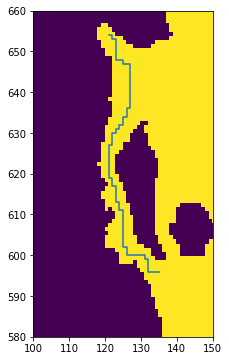

In [34]:
fig, ax = plt.subplots(figsize = (6,6))
ax.plot(bs_thalweg0[:,1], bs_thalweg0[:,0])
ax.set_xlim(100, 150)
ax.set_ylim(580,660)
viz_tools.set_aspect(ax)
ax.pcolormesh(mesh.variables['tmask'][0,0,...]);

In [36]:
bathy = xr.open_dataset('/data/vdo/MEOPAR/grid/bathymetry_201702.nc')

In [37]:
bathy2 = bathy.isel(x = slice(100, 150), y = slice(550,700))

In [54]:
bathy2.to_netcdf('bathy2.nc')

syncing


In [56]:
mesh2.to_netcdf('mesh2.nc', engine = 'scipy')

syncing


In [57]:
mesh3 = nc.Dataset('mesh2.nc')
bathy3 = nc.Dataset('bathy2.nc')

In [38]:
with open('bs_thalweg_cropped.txt', 'w') as f:
    for row in bs_thalweg0:
        f.write(str(int(row[0]-550)) +' ' +str(int(row[1] - 100)) + '\n')

In [39]:
together[together > 2] = 0

In [41]:
together.max()

1.0587487

In [62]:
from salishsea_tools import visualisations as vis2

In [66]:
dates = np.array([])
for f in ([f0, f1, f2, f3, f4, f5, f6, f7, f8, f9, f10, f11, f12, f13, f14, f15, f16,
           f17, f18, f19, f20, f21, f22, f23,f24, f25, f26, f27, f28, f29, f30]):
    dates = np.append(dates, nc.num2date(f.variables['time_counter'][:], f.variables['time_counter'].units))

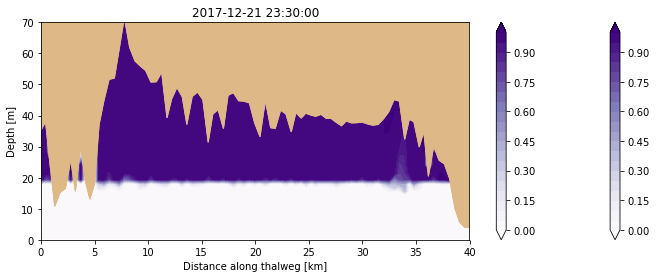

In [71]:
fig, ax = plt.subplots(figsize = (12,4))
def init():
    vis2.contour_thalweg(ax, together[0,...], bathy3, mesh3, np.arange(0,1.05,0.05), cmap = 'Purples',
                              thalweg_file = 'bs_thalweg_cropped.txt')
def animate30(i):
    ax.clear()
    visualisations.contour_thalweg(ax, together[i,...], bathy3, mesh3, np.arange(0,1.05,0.05), cmap = 'Purples',
                              thalweg_file = 'bs_thalweg_cropped.txt')
    ax.set_ylim(70, 0)
    ax.set_title(dates[i])
    return ax
interval = 0.25#in seconds
ani40 = animation.FuncAnimation(fig,animate30,frames=7440,init_func = init, 
                                interval=interval*1e+3, repeat=False)
ani40